In [1]:
import os
HOME = os.getcwd()
print(HOME)

/workspace/jay/DDP/Ocelot/yolo_binary


In [2]:
#!pip install ultralytics==8.0.20
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.8.13 torch-1.13.1+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)
Setup complete ✅ (256 CPUs, 2015.7 GB RAM, 436.7/1757.8 GB disk)


In [3]:
from ultralytics import YOLO
from IPython.display import display, Image

In [4]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

mkdir: cannot create directory ‘/workspace/jay/DDP/Ocelot/yolo_binary/datasets’: File exists
/workspace/jay/DDP/Ocelot/yolo_binary/datasets


In [4]:
from roboflow import Roboflow
rf = Roboflow(api_key="HSlZesmaM87v3kJPIxug")
project = rf.workspace("ocelot").project("cell_detect_33")
dataset = project.version(1).download("yolov8")


mkdir: cannot create directory ‘/workspace/jay/DDP/Ocelot/yolo/datasets’: File exists
/workspace/jay/DDP/Ocelot/yolo/datasets
loading Roboflow workspace...
loading Roboflow project...

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [5]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8m.pt data={dataset.location}/data.yaml epochs=100 imgsz=720 plots=True device="cuda:4"

/workspace/jay/DDP/Ocelot/yolo
Ultralytics YOLOv8.0.20 🚀 Python-3.8.13 torch-1.13.1+cu117 CUDA:4 (NVIDIA A100-SXM4-80GB, 81251MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/workspace/jay/DDP/Ocelot/yolo/datasets/cell_detect_33-1/data.yaml, epochs=100, patience=50, batch=16, imgsz=720, save=True, cache=False, device=cuda:4, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, for

In [11]:
%cd {HOME}
!yolo task=detect mode=predict model=/workspace/jay/DDP/Ocelot/yolo_binary/runs/detect/train/weights/best.pt conf=0.2 iou=0.5 source=/workspace/jay/DDP/Ocelot/yolo_binary/datasets/cell_detect_33-1/test/images save=True hide_conf=True hide_labels=True save_txt=True 

/workspace/jay/DDP/Ocelot/yolo_binary
Ultralytics YOLOv8.0.20 🚀 Python-3.8.13 torch-1.13.1+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)
Model summary (fused): 218 layers, 25840918 parameters, 0 gradients, 78.7 GFLOPs
image 1/40 /workspace/jay/DDP/Ocelot/yolo_binary/datasets/cell_detect_33-1/test/images/013_jpg.rf.678acd5d3b5d2ce480209ef21862d2a3.jpg: 736x736 96 0s, 27 1s, 10.2ms
image 2/40 /workspace/jay/DDP/Ocelot/yolo_binary/datasets/cell_detect_33-1/test/images/016_jpg.rf.8a299601b8af57cd60d55ea2ca2f3d2a.jpg: 736x736 40 0s, 152 1s, 208.6ms
image 3/40 /workspace/jay/DDP/Ocelot/yolo_binary/datasets/cell_detect_33-1/test/images/024_jpg.rf.252cda0950c1e61a8d634380d03c5772.jpg: 736x736 89 1s, 9.7ms
image 4/40 /workspace/jay/DDP/Ocelot/yolo_binary/datasets/cell_detect_33-1/test/images/026_jpg.rf.276c49ab8c0a1cfd5b6a2d79c81b2065.jpg: 736x736 29 0s, 230 1s, 9.8ms
image 5/40 /workspace/jay/DDP/Ocelot/yolo_binary/datasets/cell_detect_33-1/test/images/027_jpg.rf.74b1b03fca16869504f1a78d4b62a

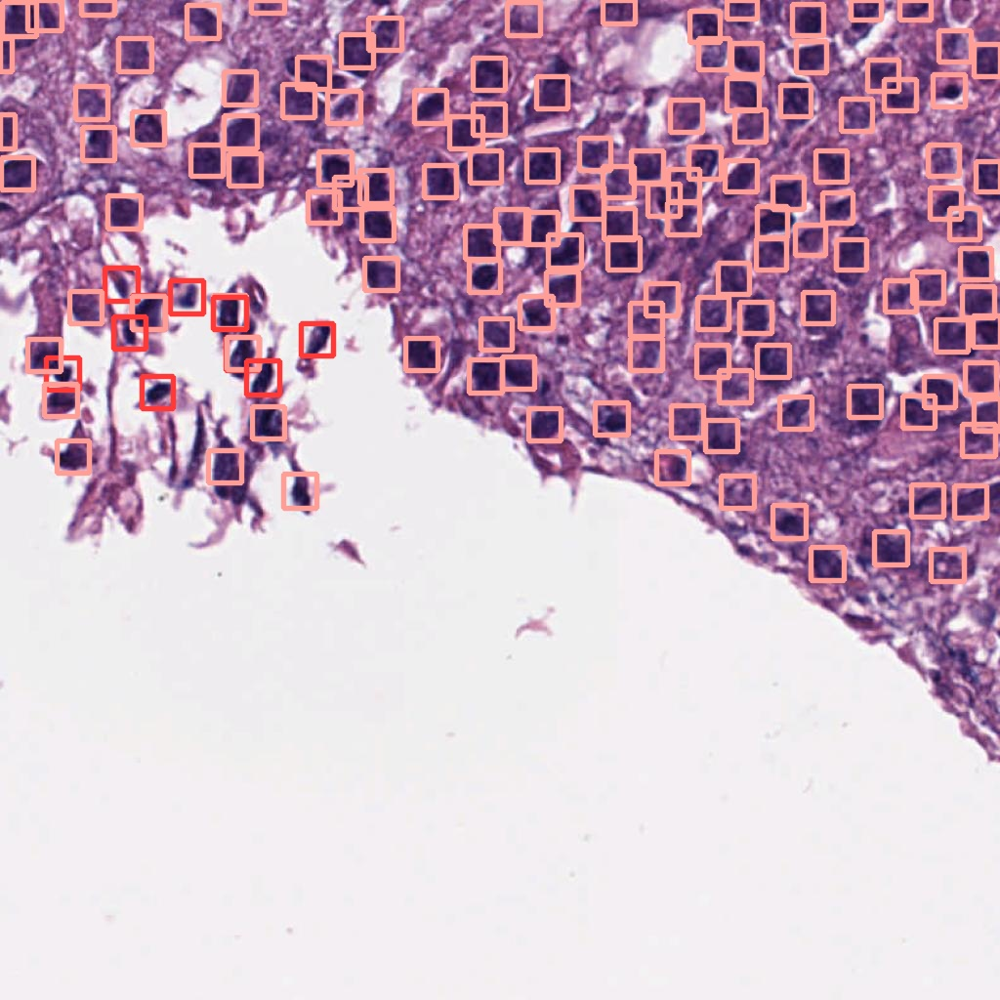

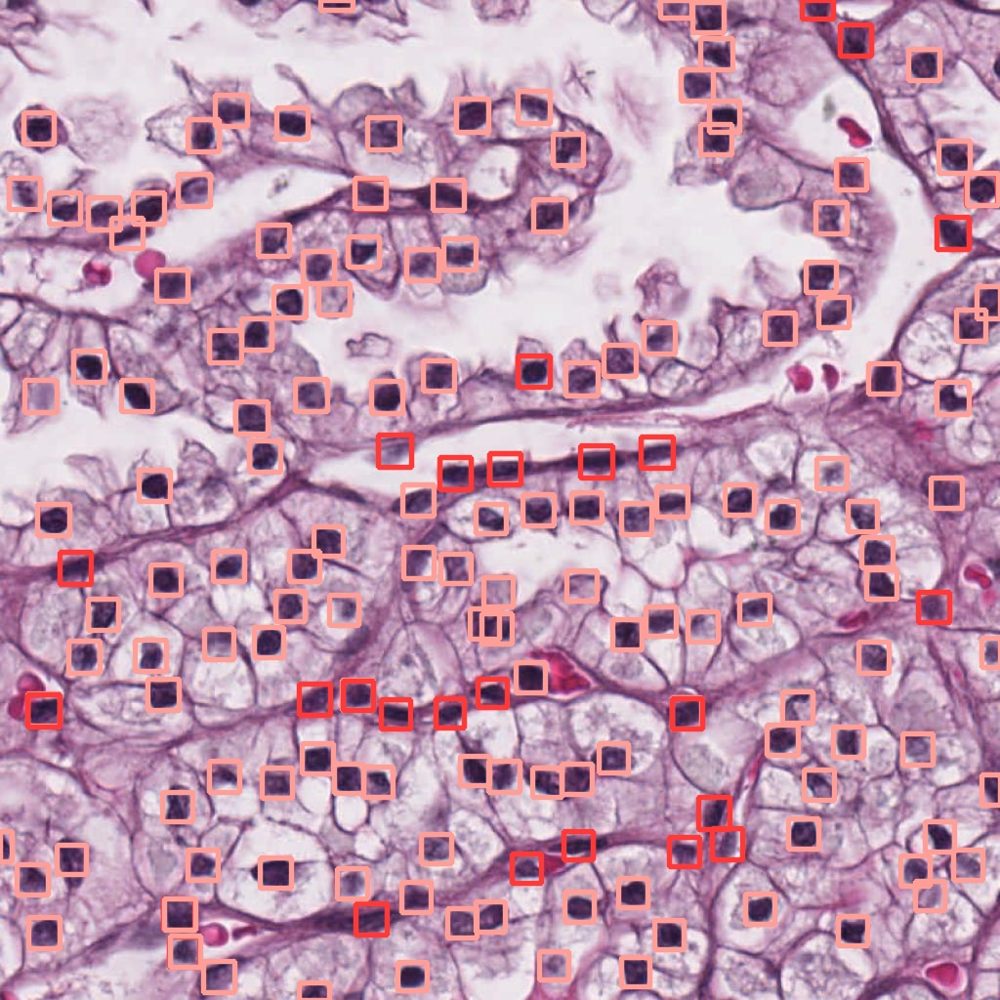

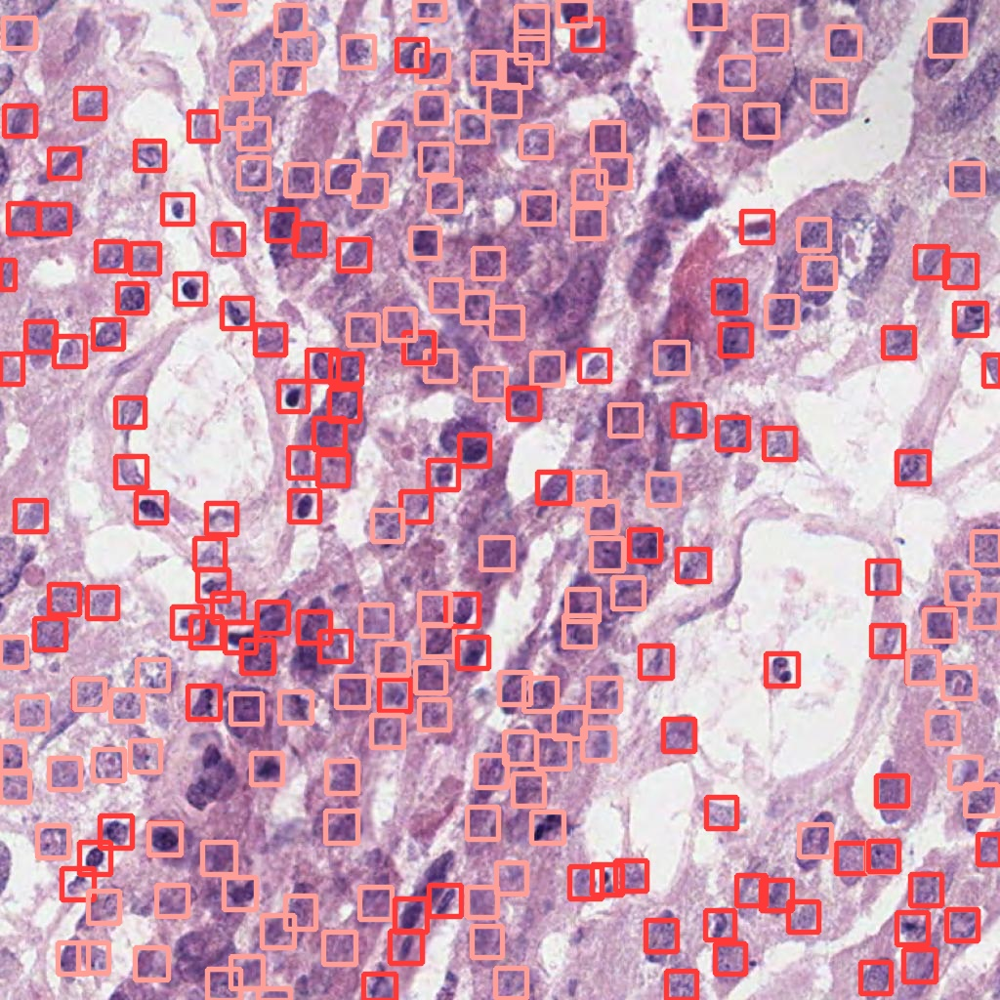

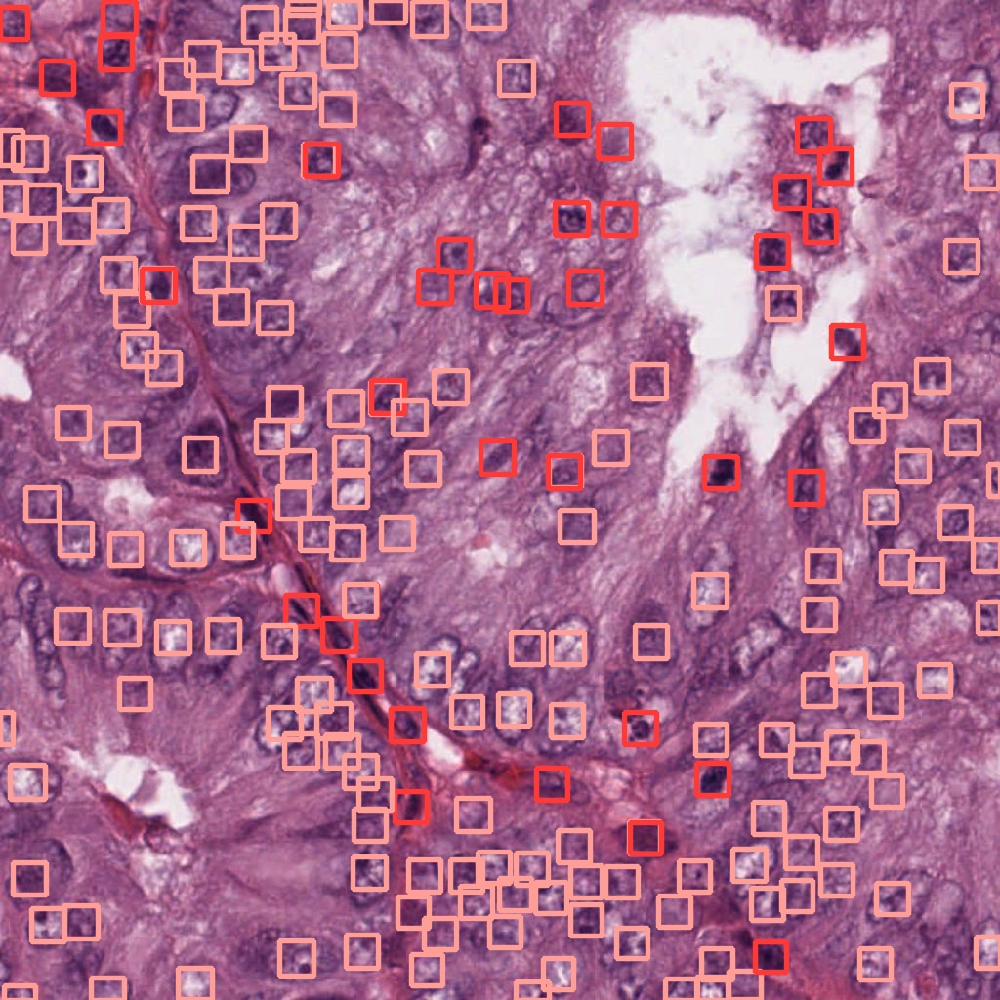

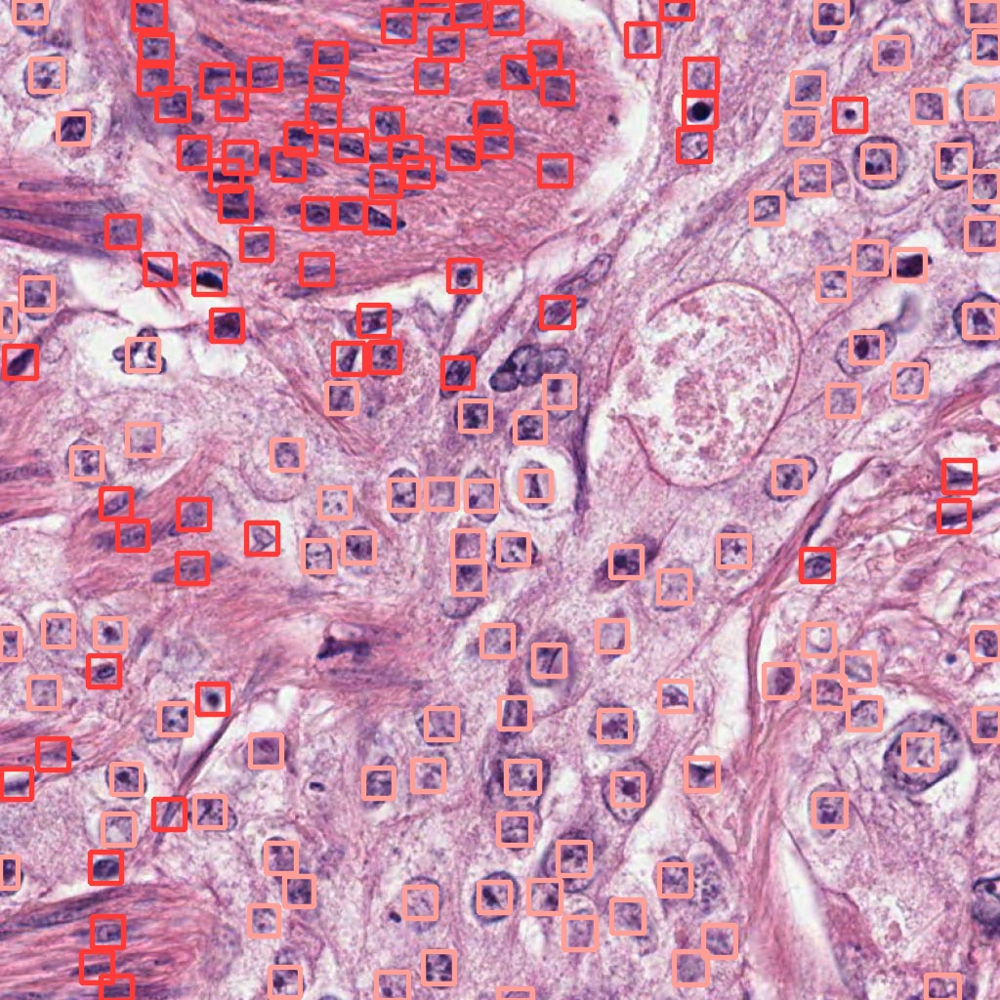

...

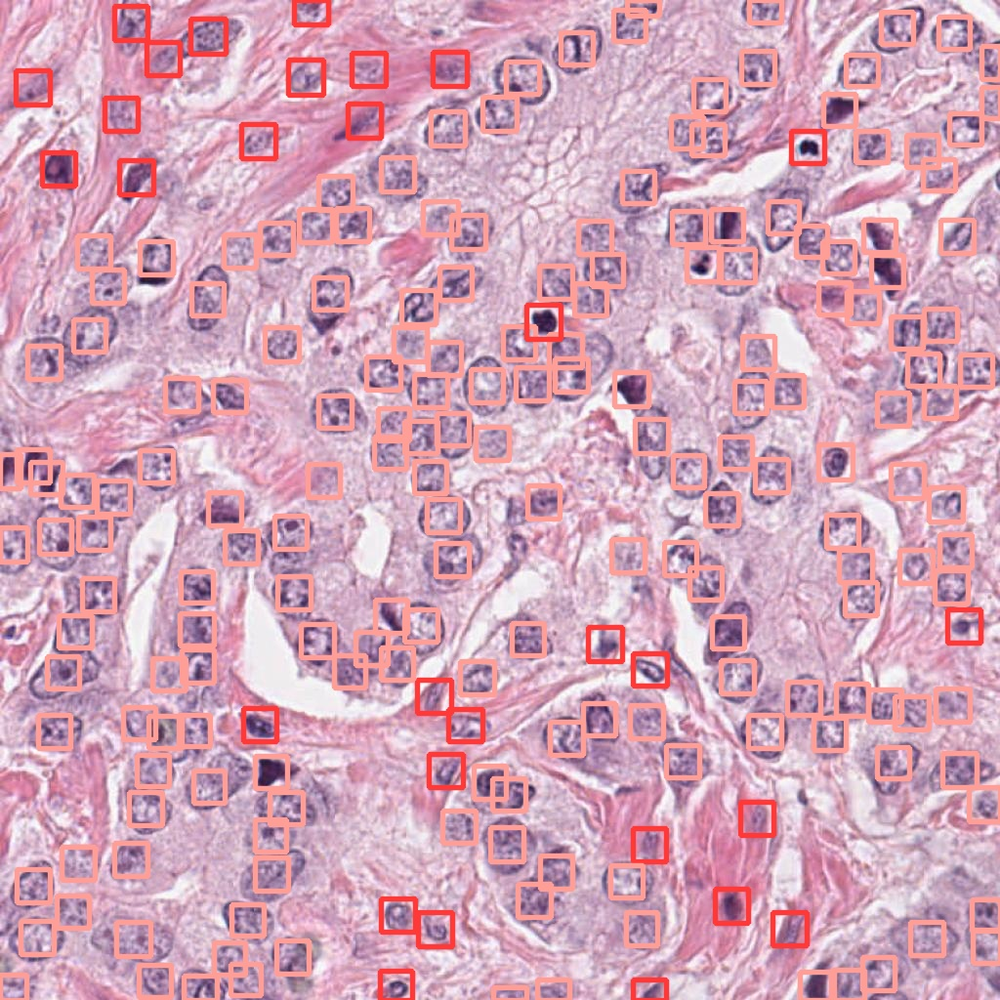

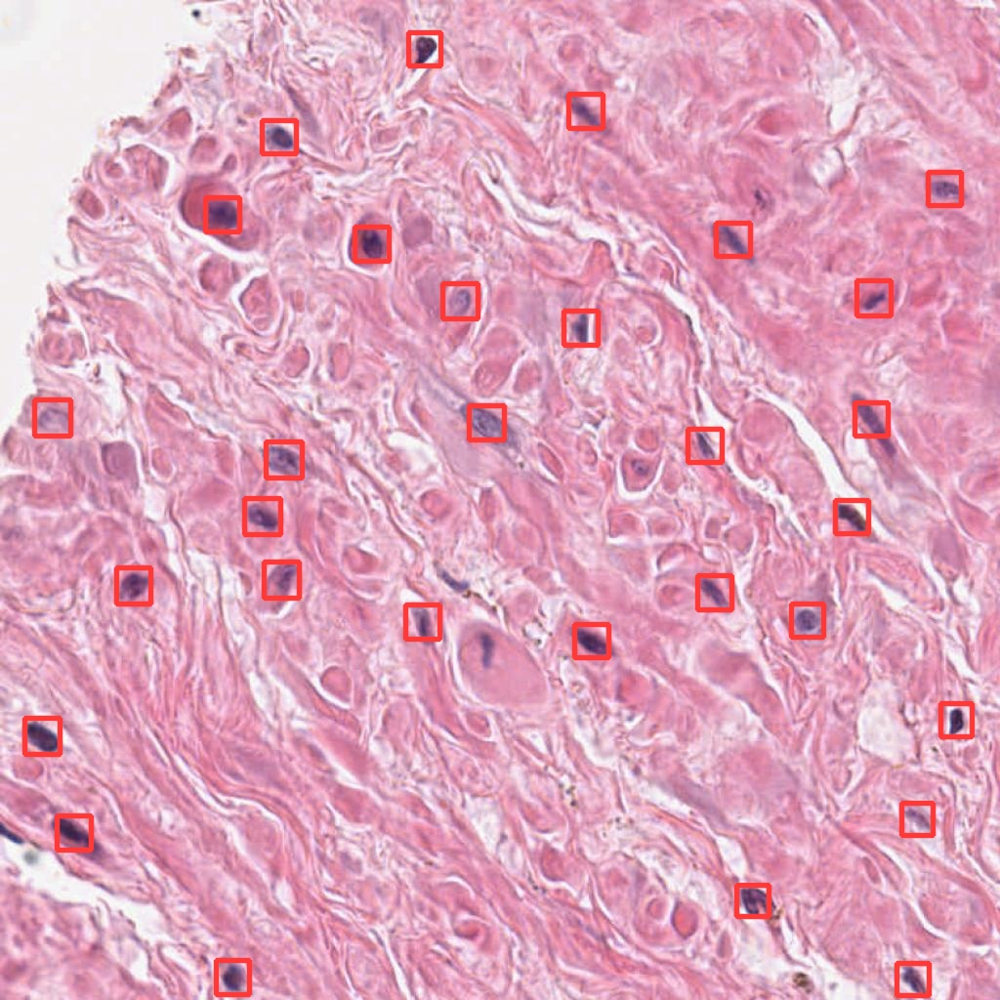

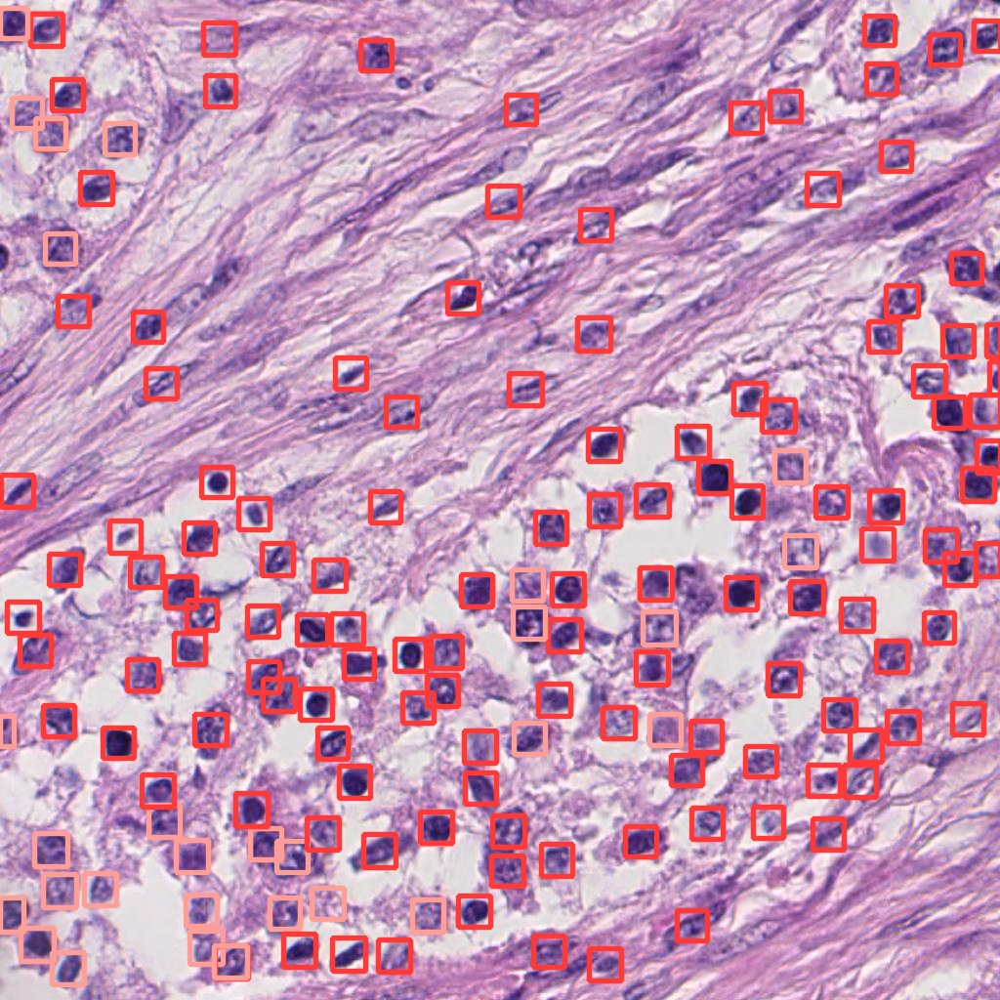

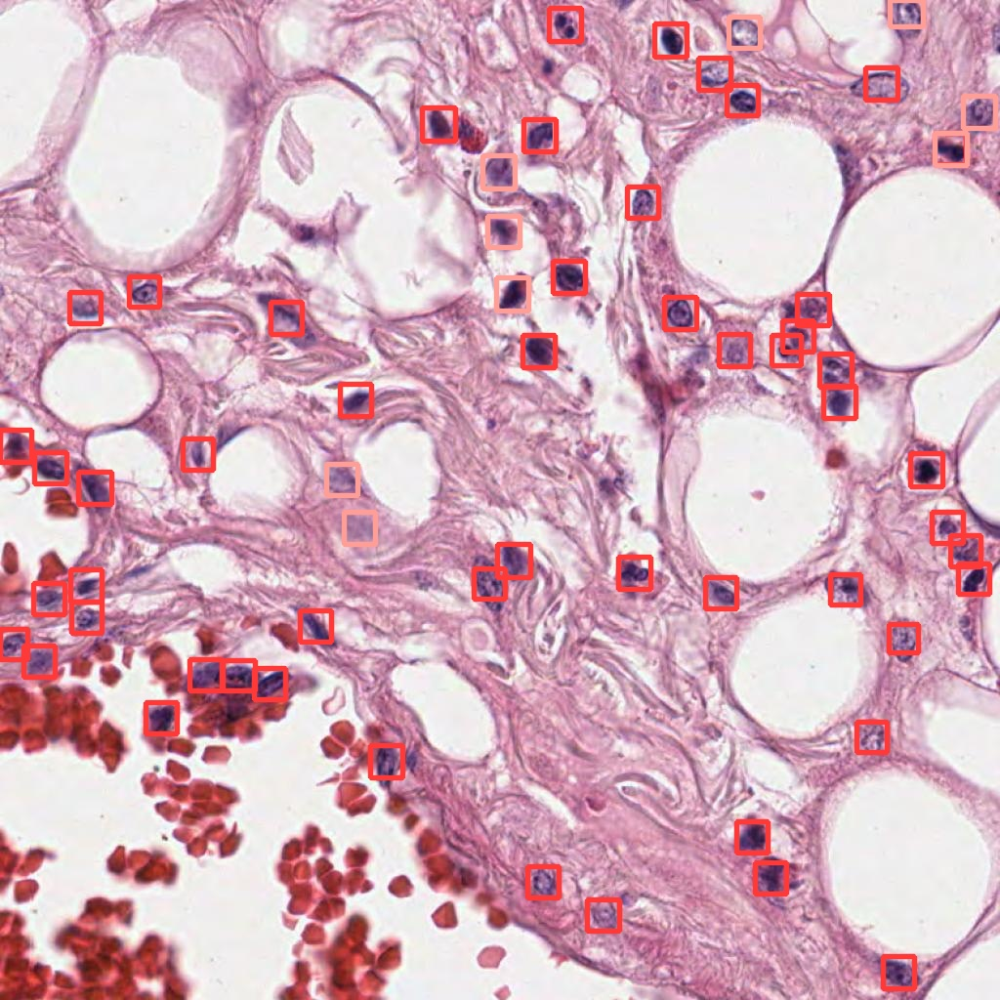

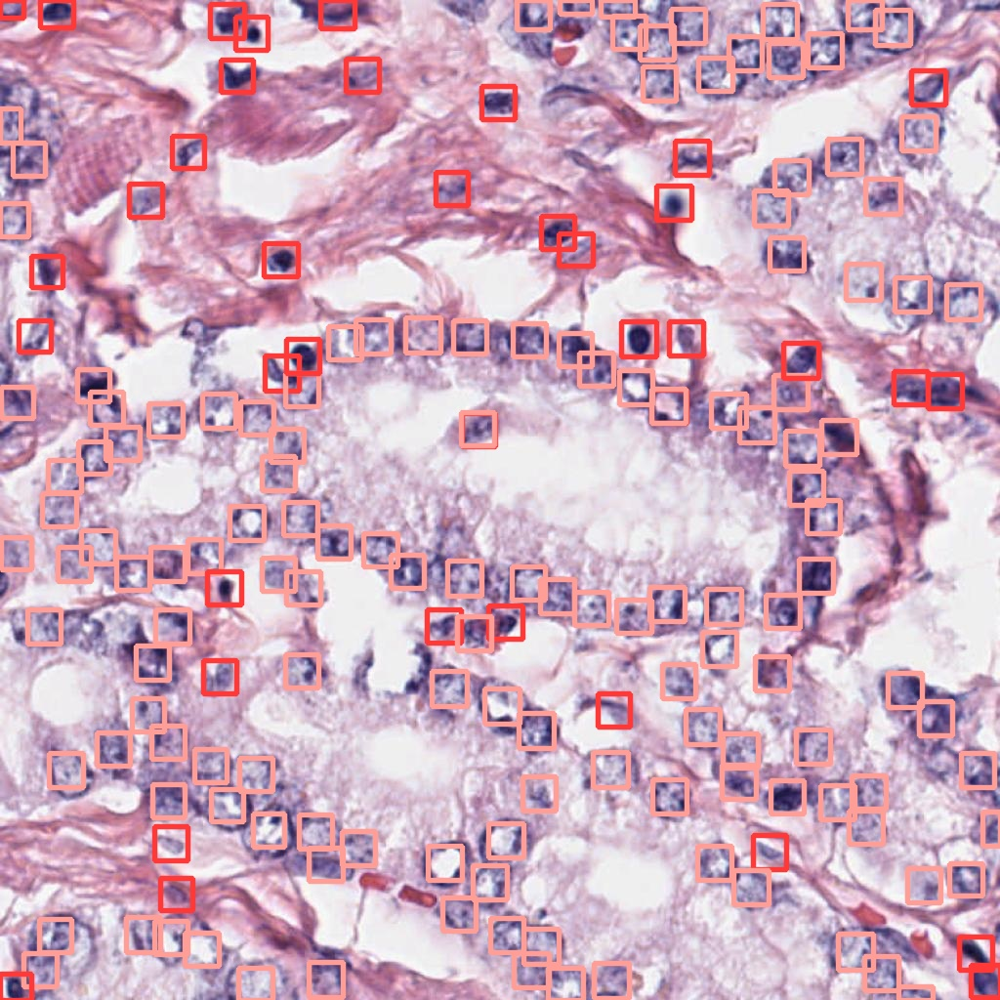

In [12]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict6/*.jpg')[:30]:
        display(Image(filename=image_path, width=500))
        print("\n")

In [16]:
!yolo export model=yolov8s.pt format=torchscript

Ultralytics YOLOv8.0.20 🚀 Python-3.8.13 torch-1.13.1+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)
YOLOv8s summary (fused): 168 layers, 11156544 parameters, 0 gradients, 28.6 GFLOPs

PyTorch: starting from yolov8s.pt with output shape (1, 84, 8400) (21.5 MB)

TorchScript: starting export with torch 1.13.1+cu117...
TorchScript: export success ✅ 0.9s, saved as yolov8s.torchscript (42.9 MB)

Export complete (3.0s)
Results saved to /workspace/jay/InterIIT/YoloV8
Predict:         yolo task=detect mode=predict model=yolov8s.torchscript -WARNING ⚠️ not yet supported for YOLOv8 exported models
Validate:        yolo task=detect mode=val model=yolov8s.torchscript -WARNING ⚠️ not yet supported for YOLOv8 exported models
Visualize:       https://netron.app


In [5]:
new_model = YOLO('/workspace/jay/InterIIT/YoloV8/runs/detect/train2/weights/best.pt')

In [6]:
img = Image.open('/workspace/jay/InterIIT/YoloV8/datasets/num1num2num3-1/test/images/adityawarangal_icu_mon-02_2023_1_2_4_15_24_jpeg_jpg.rf.655a0604ee8156eb02fc0d74845c080a.jpg')
out = new_model(np.array(img))

Ultralytics YOLOv8.0.20 🚀 Python-3.8.13 torch-1.13.1+cu117 CUDA:0 (NVIDIA A100-SXM4-80GB, 81251MiB)
Model summary (fused): 168 layers, 11129067 parameters, 0 gradients, 28.5 GFLOPs


In [7]:
npp = out[0]

In [8]:
npp = npp.cpu().numpy()

In [9]:
npp.boxes.data

array([[        907,          95,        1013,         169,     0.89059,           1],
       [        896,         172,        1008,         248,     0.88563,           7],
       [        899,         464,         981,         533,     0.85731,           4],
       [          1,         460,         828,         543,     0.79135,           5],
       [          0,          95,         829,         161,     0.71519,           2],
       [          0,         182,         829,         247,     0.30058,           8]], dtype=float32)

In [4]:
from PIL import Image
import numpy as np


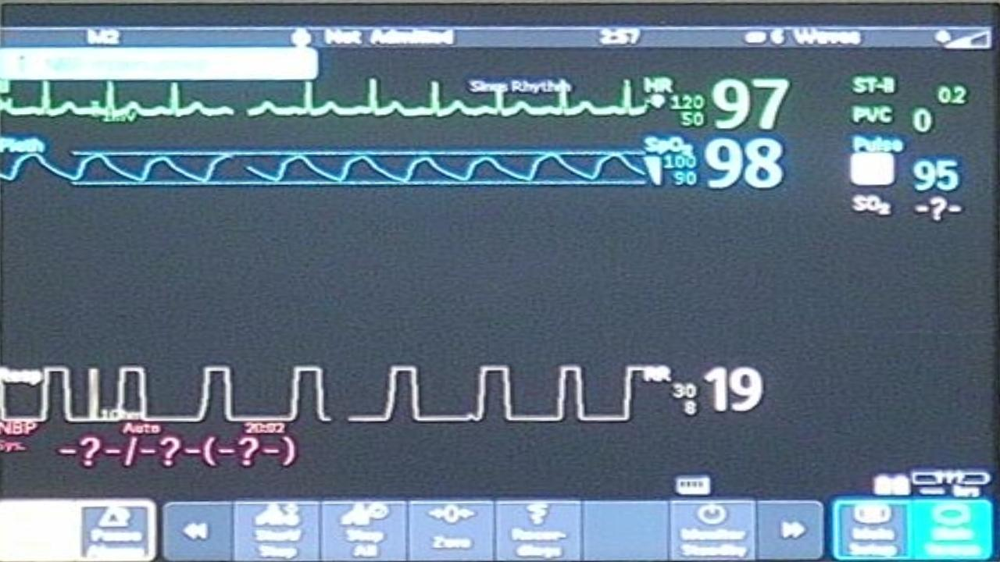

In [11]:
img